In [0]:
!pip install wordcloud
!pip install nltk
!pip install textblob
!pip install plotly

You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-be03e3a5-a780-45f1-9889-1b7384df4a08/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-be03e3a5-a780-45f1-9889-1b7384df4a08/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-be03e3a5-a780-45f1-9889-1b7384df4a08/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-be03e3a5-a780-45f1-9889-1b7384df4a08/bin/python -m pip install --upgrade pip' command.


In [0]:
import gc # garbage collector
import numpy as np # linear algebra
from collections import Counter # for counting commong words
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # visualization
plt.style.use('fivethirtyeight') # use ggplot ploting style
import seaborn as sns # visualization 
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python
import re # regular expression
import string # for finding punctuation in text
import nltk # preprocessing text
from textblob import TextBlob
# import ploty for visualization
import plotly
import plotly.offline as py # make offline 
py.init_notebook_mode(connected=True)
import plotly.tools as tls
import plotly.graph_objs as go
from plotly.graph_objs import *
import plotly.tools as tls
import plotly.figure_factory as fig_fact
import plotly.io as pio
pio.renderers.default = 'notebook'
# remove war
import warnings
warnings.filterwarnings('ignore')
# this will allow ploting inside the notebook
%matplotlib inline
import matplotlib.pyplot as plt
import base64
from io import BytesIO

In [0]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [0]:
import pyspark
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("answers").getOrCreate()

path = "/FileStore/tables/yelp_academic_dataset_business.csv"

df_yelp_business = spark.read.option("header",'True').option('delimiter', ',').csv(path)
df_yelp_business.printSchema()
# df_yelp_business.head()
display(df_yelp_business)

root
 |-- business_id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- address: string (nullable = true)
 |-- city: string (nullable = true)
 |-- state: string (nullable = true)
 |-- postal_code: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- stars: string (nullable = true)
 |-- review_count: string (nullable = true)
 |-- is_open: string (nullable = true)
 |-- categories: string (nullable = true)
 |-- hours: string (nullable = true)
 |-- attributes_ByAppointmentOnly: string (nullable = true)
 |-- attributes_BusinessAcceptsCreditCards: string (nullable = true)
 |-- hours_Monday: string (nullable = true)
 |-- hours_Tuesday: string (nullable = true)
 |-- hours_Wednesday: string (nullable = true)
 |-- hours_Thursday: string (nullable = true)
 |-- hours_Friday: string (nullable = true)
 |-- hours_Saturday: string (nullable = true)
 |-- attributes_BikeParking: string (nullable = true)
 |-- attributes_Restaurant

In [0]:
from pyspark.sql.functions import split

# split categories column and store each category in its own column
df_yelp_business = df_yelp_business.withColumn("category_1", split(df_yelp_business["categories"], ",").getItem(0))
df_yelp_business = df_yelp_business.withColumn("category_2", split(df_yelp_business["categories"], ",").getItem(1))
df_yelp_business = df_yelp_business.withColumn("category_3", split(df_yelp_business["categories"], ",").getItem(2))

# drop the original categories column
df_yelp_business = df_yelp_business.drop("categories")

# show the head of the dataset
df_yelp_business.show()

+--------------------+--------------------+--------------------+--------------+-----+-----------+-------------+--------------+-----+------------+-------+-----+----------------------------+-------------------------------------+------------+-------------+---------------+--------------+------------+--------------+----------------------+---------------------------------+--------------------+-----------------------------+------------------------------+-----------------+---------------+--------------------------+-------------------------------+--------------------+-------------------------+----------------+----------------------------------+----------------------+------------+------------------+----------------------+----------------------------+--------------------+----------------------------------+-----------------------------------+--------------------+----------+---------------------+----------------------+---------------------------------+------------------+----------------+-----------

In [0]:
from pyspark.sql.functions import col
import plotly.graph_objs as go
from IPython.core.display import display, HTML

# filter the dataset
df_yelp_business_restaurants = df_yelp_business.filter((col('category_1') == 'Restaurants') | (col('category_2') == 'Restaurants') | (col('category_3') == 'Restaurants'))

# select the required columns and convert to Pandas DataFrame
pdf = df_yelp_business_restaurants.select('name', 'stars', 'latitude', 'longitude').toPandas()

# create hover text
hover_text = pdf[['name', 'stars']].astype(str).apply(lambda x: '. Rating: '.join(x), axis=1).tolist()

# set up Mapbox access token
mapbox_access_token = 'pk.eyJ1IjoiYWtzaGF5cGF0aWwxNCIsImEiOiJjbGd3eTNzeXkwZzh6M2ZuM3Q1amVtemF5In0.mQMapkGAR2H3IAaLnbljow'

# create data for Plotly
data = [go.Scattermapbox(
    lat=pdf['latitude'].tolist(),
    lon=pdf['longitude'].tolist(),
    mode='markers',
    marker=dict(
        size=9,
        symbol='bar'
    ),
    text=hover_text
)]

# set up layout for Plotly
layout = go.Layout(
    title='Zoom to your location and find your desired restaurants',
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=39.4440302947,
            lon=-98.9565517008
        ),
        style='light',
        pitch=0,
        zoom=3
    ),
)

# create Plotly figure
fig = go.Figure(data=data, layout=layout)

# display the map
# display(HTML(fig.to_html(full_html=False)))
fig.show(renderer='databricks')

In [0]:
# File location and type
file_location = "/FileStore/tables/tip-2.json"
file_type = "json"

# CSV options
infer_schema = "false"
first_row_is_header = "false"
delimiter = ","

# Read the tips json into a spark dataframe
tipDataFrame = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

,year,count
0,2010,1
1,2012,3
2,2013,3
3,2014,2


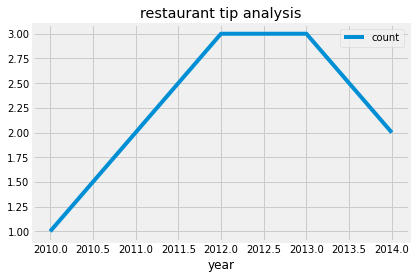

In [0]:
#Filter the tipDataFrame by specific business id 
from pyspark.sql import functions as F
business_spec_tips = tipDataFrame.select('business_id', 'compliment_count', 'date', 'text', 'user_id').filter(F.col('business_id')== '-eLCHvtz99fc985UNL1rTA')

#Count the number of tips per year and sort by year
tip_trend_over_years = business_spec_tips.groupby(F.year('date').alias('year')).count().orderBy('year', ascending=True).toPandas()

#Plot tip trend over the years

# tip_trend_over_years.title("restaurant tip analysis", fontsize=15)
tip_trend_over_years.plot(x='year', y ='count', title = 'restaurant tip analysis')
tmpfile5 = BytesIO()
plt.savefig(tmpfile5, format='png', bbox_inches='tight')
encoded5 = base64.b64encode(tmpfile5.getvalue()).decode('utf-8')

display(tip_trend_over_years)

In [0]:
path_review = "/FileStore/tables/review_demo__1_.json"
file_type = "json"

# CSV options
infer_schema = "false"
first_row_is_header = "false"
delimiter = ","

reviewDataFrame = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(path_review)

In [0]:
display(reviewDataFrame)

DataFrame[business_id: string, cool: bigint, date: string, funny: bigint, review_id: string, stars: double, text: string, useful: bigint, user_id: string]

In [0]:
df_yelp_review = reviewDataFrame

In [0]:
# Join the review and business dataframes using the 'business_id' column
df_yelp_review = df_yelp_review.join(df_yelp_business_restaurants.select('business_id', 'name'),on='business_id',how='inner')

# Take the top 20 most occurring restaurants for analysis
top_restaurants = (df_yelp_review.groupBy('name').count().orderBy(col('count').desc()).limit(20).select('name').rdd.flatMap(lambda x: x).collect())

# Create a new dataframe called 'df_review_top' that only contains the reviews of 'top_restaurants'
df_review_top = df_yelp_review.filter(col('name').isin(top_restaurants))

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType, DoubleType
from pyspark.ml.feature import StopWordsRemover, Tokenizer
import re

# Download the stopwords
import nltk
nltk.download('stopwords')

# Define the preprocessing function
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())  # get rid of noise
    return ' '.join(x.split())  # then join the text again

# Define the sentiment analysis function
def sentiment(x):
    from textblob import TextBlob
    sentiment = TextBlob(x)
    return sentiment.sentiment.polarity

# Create a UDF for the preprocessing function
preprocess_udf = udf(preprocess, StringType())

# Create a Tokenizer transformer
tokenizer = Tokenizer(inputCol='text', outputCol='words')

# Apply the Tokenizer
df_review_top = tokenizer.transform(df_review_top)

# Create a StopWordsRemover transformer
remover = StopWordsRemover(inputCol='words', outputCol='text_clear')

# Apply the StopWordsRemover
df_review_top = remover.transform(df_review_top)

# Apply the preprocessing UDF to the text_clear column
df_review_top = df_review_top.withColumn('text_clear', preprocess_udf(df_review_top['text_clear']))

# Create a UDF for the sentiment analysis function
sentiment_udf = udf(sentiment, DoubleType())

# Apply the sentiment analysis UDF to the text_clear column
df_review_top = df_review_top.withColumn('senti_polarity', sentiment_udf(df_review_top['text_clear']))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [0]:
df_yelp_tip = tipDataFrame

In [0]:
# function for pre-processing the text of reviews
# this function remove punctuation and stopwords
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())                  # get rid of noise
    x = [w for w in x.split() if w not in stopwords]  # remove stopwords
    return ' '.join(x) # then join the text again

# let's find out which stopwords need to remove. We'll use english stopwords.
i = nltk.corpus.stopwords.words('english')
# punctuations to remove
j = list(string.punctuation)
# finally let's combine all of these
stopwords = set(i).union(j)

# df_yelp_tip dataset has business id but don't have businesss name.
# But df_yelp_business_restaurants have business name and business id.
# So I take the df_yelp_tip business_id and match with df_yelp_business_restaurants business id.
# And take the business name from df_yelp_business_restaurants and create a new column in df_yelp_tip that holds business name
df_yelp_tip = df_yelp_tip.join(df_yelp_business_restaurants.select('business_id', 'name'), on='business_id', how='inner')
# create a new dataframe called 'df_yelp_tip_top' that only contains the reviews of 'top_restaurants'
df_yelp_tip_top = df_yelp_tip.filter(df_yelp_tip.name.isin(top_restaurants))
# pre process the text
preprocess_udf = udf(preprocess, StringType())
df_yelp_tip_top = df_yelp_tip_top.withColumn('text_clear', preprocess_udf('text'))


In [0]:
from pyspark.sql.functions import col

preprocess_udf = udf(preprocess, StringType())
resturant_name = input("Enter restaurant name: ") #Outback Steakhouse
df_for_individual_resturant = df_yelp_business_restaurants.filter(col('name') == resturant_name)
restaurant_address = df_for_individual_resturant.select('address').collect()[0]['address']
restaurant_city = df_for_individual_resturant.select('city').collect()[0]['city']
restaurant_state = df_for_individual_resturant.select('state').collect()[0]['state']
restaurant_postal_code = df_for_individual_resturant.select('postal_code').collect()[0]['postal_code']
restaurant_business_id = df_for_individual_resturant.select('business_id').collect()[0]['business_id']

df_for_individual_resturant = df_yelp_review.filter(col('business_id').isin(restaurant_business_id))
df_for_individual_resturant = df_for_individual_resturant.withColumn('text_clear', preprocess_udf(col('text')))

Enter restaurant name:  Outback Steakhouse

In [0]:
print(df_for_individual_resturant.columns)

['business_id', 'cool', 'date', 'funny', 'review_id', 'stars', 'text', 'useful', 'user_id', 'name', 'text_clear']


In [0]:
df_for_individual_resturant.show()

+--------------------+----+-------------------+-----+--------------------+-----+--------------------+------+--------------------+------------------+--------------------+
|         business_id|cool|               date|funny|           review_id|stars|                text|useful|             user_id|              name|          text_clear|
+--------------------+----+-------------------+-----+--------------------+-----+--------------------+------+--------------------+------------------+--------------------+
|-eLCHvtz99fc985UN...|   0|2012-09-17 19:13:47|    0|6Ek2QM44B_JdibW-W...|  4.0|Food and service ...|     0|GYSMvuXoNcd9jqARP...|Outback Steakhouse|food service grea...|
|-eLCHvtz99fc985UN...|   0|2012-05-15 02:02:38|    0|ZqlvaxmyievvPSW5q...|  4.0|Went there tonigh...|     0|XmPWaUcA9OaT0L-Cn...|Outback Steakhouse|went tonight wow ...|
|-eLCHvtz99fc985UN...|   1|2014-01-05 22:02:44|    0|Qb-zj4ftPDHesLN-5...|  5.0|Outback is always...|     2|G1QXURTPNjPGbmvza...|Outback Steakhouse|ou

In [0]:
# wc = WordCloud(background_color='white', width=1600, height=800, random_state=1, max_words=200000000)

# wc.generate(str(df_for_individual_resturant['text_clear']))

# # Plot the word cloud
# plt.figure(figsize=(10,5), facecolor='white')
# plt.title("Customers reviews about %s restaurant"% (restaurant_name), fontsize=15,color='black')
# plt.imshow(wc, interpolation='bilinear')
# plt.axis("Off")
# plt.tight_layout()
# plt.show()

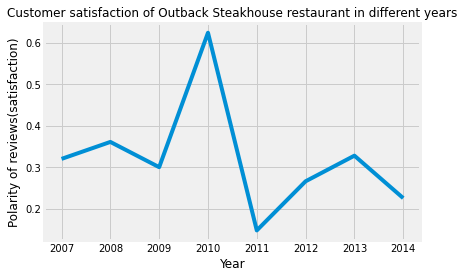

In [0]:
from pyspark.sql.functions import udf, year
from pyspark.sql.types import DoubleType
import matplotlib.pyplot as plt

# Define UDF for sentiment analysis
sentiment_udf = udf(sentiment, DoubleType())

# Calculate sentiment polarity for each review
df_for_individual_resturant = df_for_individual_resturant.withColumn('senti_polarity', sentiment_udf('text_clear'))

# Extract year from the date column
df_for_individual_resturant = df_for_individual_resturant.withColumn('year', year('date'))

# Calculate mean sentiment polarity for each year
df_mean_polarity = df_for_individual_resturant.groupBy('year').agg({'senti_polarity': 'mean'}).orderBy('year')

# Convert to pandas dataframe for plotting
df_plot = df_mean_polarity.toPandas()

# Plot the graph
plt.plot(df_plot['year'], df_plot['avg(senti_polarity)'])
plt.title("Customer satisfaction of %s restaurant in different years"% (resturant_name), fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Polarity of reviews(satisfaction)', fontsize=12)
tmpfile2 = BytesIO()
plt.savefig(tmpfile2, format='png', bbox_inches='tight')
encoded2 = base64.b64encode(tmpfile2.getvalue()).decode('utf-8')
plt.show()

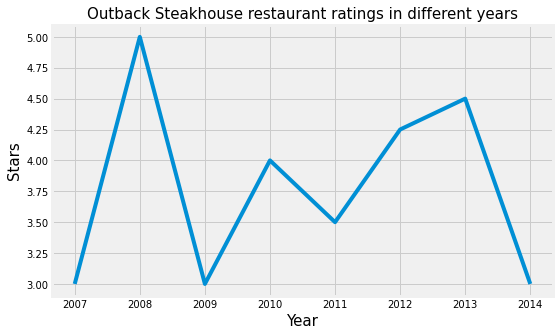

In [0]:
import base64
from io import BytesIO
from pyspark.sql.functions import year, mean

df_for_individual_resturant = df_for_individual_resturant.withColumn('date', df_for_individual_resturant['date'].cast('timestamp'))
df_ratings_by_year = df_for_individual_resturant.groupBy(year('date').alias('year')).agg(mean('stars').alias('mean_rating'))
df_ratings_by_year_pandas = df_ratings_by_year.orderBy('year', ascending=True).toPandas()
plt.figure(figsize=(8, 5))
plt.plot(df_ratings_by_year_pandas['year'], df_ratings_by_year_pandas['mean_rating'])
plt.title("%s restaurant ratings in different years"% (resturant_name), fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Stars', fontsize=15)
tmpfile3 = BytesIO()
plt.savefig(tmpfile3, format='png', bbox_inches='tight')
encoded3 = base64.b64encode(tmpfile3.getvalue()).decode('utf-8')
plt.show()

<Figure size 576x360 with 0 Axes>

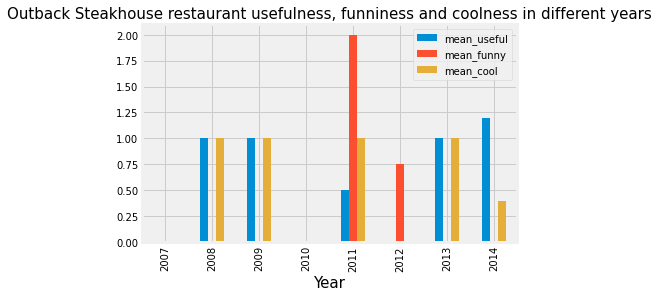

In [0]:
df_for_individual_resturant = df_for_individual_resturant.withColumn('date', df_for_individual_resturant['date'].cast('timestamp'))
df_ratings_by_year = df_for_individual_resturant.groupBy(year('date').alias('year')).agg(mean('useful').alias('mean_useful'), mean('funny').alias('mean_funny'), mean('cool').alias('mean_cool'))
df_ratings_by_year_pandas = df_ratings_by_year.orderBy('year', ascending=True).toPandas()
plt.figure(figsize=(8, 5))
df_ratings_by_year_pandas.plot(kind='bar', x='year')
plt.title("%s restaurant usefulness, funniness and coolness in different years"% (resturant_name), fontsize=15)
plt.xlabel('Year', fontsize=15)
tmpfile4 = BytesIO()
plt.savefig(tmpfile4, format='png', bbox_inches='tight')
encoded4 = base64.b64encode(tmpfile4.getvalue()).decode('utf-8')
plt.show()

In [0]:
import plotly.io as pio
import plotly.graph_objs as go
import plotly.offline as pyo


page_title_text="Yelp Report"

# generate the plotly HTML code for the figure
# figure_html = pio.write_html(fig, file = '/databricks/driver/test.html')
# figure_html = pyo.plot(fig, filename='/databricks/driver/test.html')
fig_html = pyo.plot(fig, output_type='div')

html = f'''
    <html>
        <head>
            <title>{page_title_text}</title>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <script src="https://api.tiles.mapbox.com/mapbox-gl-js/v2.3.1/mapbox-gl.js"></script>
            <link href="https://api.tiles.mapbox.com/mapbox-gl-js/v2.3.1/mapbox-gl.css" rel="stylesheet" />
        </head>
        <body>
        <h1>{page_title_text}</h1>
        <p>{"&emsp;Restaurant Name: %s"%(resturant_name)}</p>
        <p>{"&emsp;Business ID: %s" %(restaurant_business_id)}</p>
        <p>{"&emsp;Address: %s" %(restaurant_address)}</p>
        <p>{"&emsp;City: %s" %(restaurant_city)}</p>
        <p>{"&emsp;State: %s" %(restaurant_state)}</p>
        <p>{"&emsp;Postal code: %s" %(restaurant_postal_code)}</p>
        <img style='padding: 20px 20px 20px 20px;' src=\'data:image/png;base64,{encoded2}\'>
        <img style='padding: 20px 20px 20px 20px;' src=\'data:image/png;base64,{encoded3}\'>
        <img style='padding: 20px 20px 20px 20px;' src=\'data:image/png;base64,{encoded4}\'>
        <img style='padding: 20px 20px 20px 20px;' src=\'data:image/png;base64,{encoded5}\'>
        <div id='map'></div>
        </body>
    </html>
    '''

with open('/databricks/driver/test.html','w') as f:
    f.write(html)
    
pio.renderers.default = 'iframe'
pyo.plot(fig, filename='/databricks/driver/map2.html')

Out[114]: '/databricks/driver/map2.html'

In [0]:
dbutils.fs.cp("file:/databricks/driver/test.html", "dbfs:/FileStore/test.html")
dbutils.fs.cp("file:/databricks/driver/map2.html", "dbfs:/FileStore/map2.html")

Out[115]: True

In [0]:
dbutils.fs.ls("dbfs:/FileStore")

Out[116]: [FileInfo(path='dbfs:/FileStore/databricks/', name='databricks/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStore/map.html', name='map.html', size=3670016, modificationTime=1683242807000),
 FileInfo(path='dbfs:/FileStore/map1.html', name='map1.html', size=3670016, modificationTime=1683246146000),
 FileInfo(path='dbfs:/FileStore/map2.html', name='map2.html', size=4620650, modificationTime=1683330592000),
 FileInfo(path='dbfs:/FileStore/tables/', name='tables/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/FileStore/test.html', name='test.html', size=128240, modificationTime=1683330592000)]

Yelp Report 
 
 
 
 
 
 Yelp Report 
  Restaurant Name: Outback Steakhouse 
  Business ID: -eLCHvtz99fc985UNL1rTA 
  Address: 3454 W 86th St 
  City: Indianapolis 
  State: IN 
  Postal code: 46268
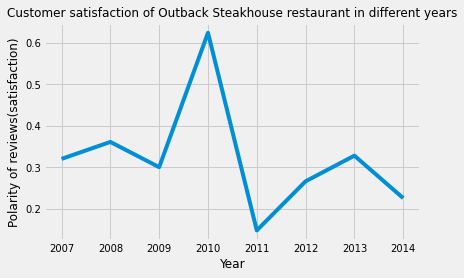
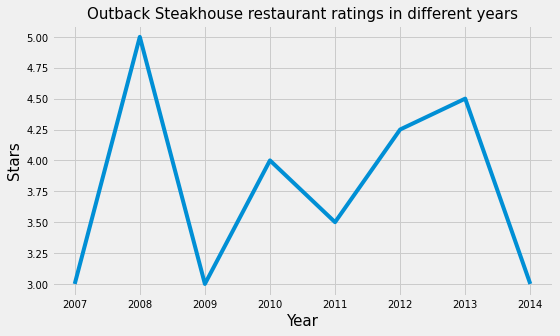
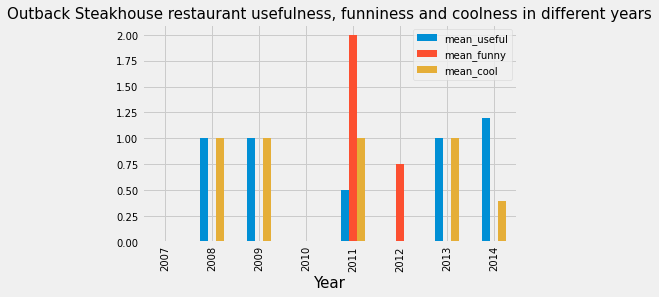
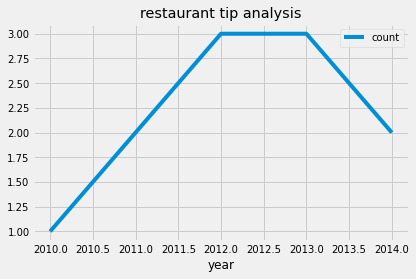

In [0]:
from IPython.display import HTML
display(HTML("map2.html"))
display(HTML("test.html"))